# Clusterizacao - Case ImdbMovies

# IMDb TOP 250 Movies
![An image](https://static.amazon.jobs/teams/53/images/IMDb_Header_Page.jpg?1501027252)

**Este projeto consiste em treinar um sistema de recomendação de filmes utilizando as informações referentes aos top 250 filmes melhor avaliados pelo público na plataforma IMDb.**
*   A extração dos dados será feita por técnicas de web scraping (crawler).
*   O objetivo principal será agrupar os 250 filmes em "n" clusters classificados a partir das suas sinopses, aplicando técnicas de processamento de texto e algoritmos de clusterização.
*   Ao final, teremos um sistemas de recomendação baseado na similaridade das sinopses, e não apenas dos generos.

**Exemplo de aplicação prática: usuários receberão recomendações de filmes que estejam no mesmo cluster de sinopses de outros filmes que ele já tenha curtido.**

# Import das bibliotecas

In [1]:
import pandas as pd
import numpy as np
import requests
from pprint import pprint
from bs4 import BeautifulSoup
import re
import json
from urllib.request import Request, urlopen
from lxml import html
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from PIL import Image
from io import BytesIO
import cv2
from unicodedata import normalize
import string
from nltk.stem import PorterStemmer

# Web Scraping / Crawler

In [2]:
userAgents=[
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/74.0.3729.157 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1.1 Safari/605.1.15"]

url = 'https://www.imdb.com/chart/top/?ref_=nv_mv_250'
response = requests.get(url, headers={"User-agent": userAgents[1]})
response

<Response [200]>

In [3]:
html = response.text
html

'<!DOCTYPE html><html lang="en-US" xmlns:og="http://opengraphprotocol.org/schema/" xmlns:fb="http://www.facebook.com/2008/fbml"><head><meta charSet="utf-8"/><meta name="viewport" content="width=device-width"/><script>if(typeof uet === \'function\'){ uet(\'bb\', \'LoadTitle\', {wb: 1}); }</script><script>window.addEventListener(\'load\', (event) => {\n        if (typeof window.csa !== \'undefined\' && typeof window.csa === \'function\') {\n            var csaLatencyPlugin = window.csa(\'Content\', {\n                element: {\n                    slotId: \'LoadTitle\',\n                    type: \'service-call\'\n                }\n            });\n            csaLatencyPlugin(\'mark\', \'clickToBodyBegin\', 1692653329986);\n        }\n    })</script><title>IMDb Top 250 Movies</title><meta name="description" content="IMDb Top 250 as rated by regular IMDb voters" data-id="main"/><meta property="og:site_name" content="IMDb"/><meta property="og:title" content="IMDb Top 250 Movies"/><meta 

In [4]:
#BeautifulSoup
bs = BeautifulSoup(html)
pprint(bs)


<!DOCTYPE html>
<html lang="en-US" xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://opengraphprotocol.org/schema/"><head><meta charset="utf-8"/><meta content="width=device-width" name="viewport"/><script>if(typeof uet === 'function'){ uet('bb', 'LoadTitle', {wb: 1}); }</script><script>window.addEventListener('load', (event) => {
        if (typeof window.csa !== 'undefined' && typeof window.csa === 'function') {
            var csaLatencyPlugin = window.csa('Content', {
                element: {
                    slotId: 'LoadTitle',
                    type: 'service-call'
                }
            });
            csaLatencyPlugin('mark', 'clickToBodyBegin', 1692653329986);
        }
    })</script><title>IMDb Top 250 Movies</title><meta content="IMDb Top 250 as rated by regular IMDb voters" data-id="main" name="description"/><meta content="IMDb" property="og:site_name"/><meta content="IMDb Top 250 Movies" property="og:title"/><meta content="IMDb Top 250 as rated b

## Title EN

In [5]:
titles = bs.find_all('h3', attrs={'class': 'ipc-title__text'})
titles

[<h3 class="ipc-title__text">IMDb Charts</h3>,
 <h3 class="ipc-title__text">1. Um Sonho de Liberdade</h3>,
 <h3 class="ipc-title__text">2. O Poderoso Chefão</h3>,
 <h3 class="ipc-title__text">3. Batman: O Cavaleiro das Trevas</h3>,
 <h3 class="ipc-title__text">4. O Poderoso Chefão II</h3>,
 <h3 class="ipc-title__text">5. 12 Homens e uma Sentença</h3>,
 <h3 class="ipc-title__text">6. A Lista de Schindler</h3>,
 <h3 class="ipc-title__text">7. O Senhor dos Anéis: O Retorno do Rei</h3>,
 <h3 class="ipc-title__text">8. Pulp Fiction - Tempo de Violência</h3>,
 <h3 class="ipc-title__text">9. O Senhor dos Anéis: A Sociedade do Anel</h3>,
 <h3 class="ipc-title__text">10. Três Homens em Conflito</h3>,
 <h3 class="ipc-title__text">11. Forrest Gump: O Contador de Histórias</h3>,
 <h3 class="ipc-title__text">12. Clube da Luta</h3>,
 <h3 class="ipc-title__text">13. O Senhor dos Anéis: As Duas Torres</h3>,
 <h3 class="ipc-title__text">14. A Origem</h3>,
 <h3 class="ipc-title__text">15. Star Wars: Epi

In [6]:
list_title_en = []
for x in titles[1:-12]:
  tit = (x.text).split(">")[0].strip()
  list_title_en.append(tit)

display(len(list_title_en))
list_title_en[:5]

250

['1. Um Sonho de Liberdade',
 '2. O Poderoso Chefão',
 '3. Batman: O Cavaleiro das Trevas',
 '4. O Poderoso Chefão II',
 '5. 12 Homens e uma Sentença']

## Year

In [7]:
list_years = []
years = bs.find_all('div', attrs={'class':'cli-title-metadata'})
for y in years:
  year = y.find('span', attrs={'class':'cli-title-metadata-item'}).text
  list_years.append(year)
display(len(list_years))
list_years[:5]

250

['1994', '1972', '2008', '1974', '1957']

## Rating

In [8]:
ratings = bs.find_all('div', attrs={'class':'cli-ratings-container'})
list_rating = []
for r in ratings:
  rating = r.find('span').text
  list_rating.append(rating)

display(len(list_rating))
pprint(list_rating[:5])

250

['9.3', '9.2', '9.0', '9.0', '9.0']


In [9]:
image_links = bs.find_all("div", attrs ={"class":"ipc-media__img"})
list_images = []
for i in image_links:
    images = i.find("img").get("src")
    list_images.append(images)

In [10]:
list_images[:5]

['https://m.media-amazon.com/images/M/MV5BNDE3ODcxYzMtY2YzZC00NmNlLWJiNDMtZDViZWM2MzIxZDYwXkEyXkFqcGdeQXVyNjAwNDUxODI@._V1_QL75_UX140_CR0,1,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BZjgwNzE5ODgtYzAyZC00YTZhLThhNDktMDVlOGNhYzk5NTVkXkEyXkFqcGdeQXVyMTAzMDM4MjM0._V1_QL75_UY207_CR3,0,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BM2E1ZjEyYWQtMjgyMy00ZTkwLThkM2QtN2YwM2NmYzAyYjE0XkEyXkFqcGdeQXVyMTAzMDM4MjM0._V1_QL75_UY207_CR8,0,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BOGM2M2Q0ZWQtZjc5NC00NDY4LWIxYTktMDE4ZjIyYTRlNTIyXkEyXkFqcGdeQXVyODc0OTEyNDU@._V1_QL75_UY207_CR4,0,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BODRmNWRiYmUtNGM2Yy00NTgwLTgxNzMtMGExYzI5NjllNjBhXkEyXkFqcGdeQXVyMTAzMDM4MjM0._V1_QL75_UY207_CR3,0,140,207_.jpg']

In [11]:
image_arrays = []
for img_url in list_images:
    if img_url:
        img_response = requests.get(img_url)
        if img_response.status_code == 200:
            img_bytes = BytesIO(img_response.content)
            img_pil = Image.open(img_bytes).convert("L")
            img_np = np.array(img_pil)
            image_arrays.append(img_np)

In [12]:
len(image_arrays)

250

In [13]:
image = Image.fromarray(image_arrays[2])
image.show()

## Genre, Title PT & Year

In [14]:
list_links = []
for a in bs.find_all('a', href=True):
  if '/title/' in a['href'] and 'https://www.imdb.com/'+ a['href'] not in list_links:
    list_links.append(('https://www.imdb.com/'+a['href'])[:-15])

#Remove duplicates
list_links = list(dict.fromkeys(list_links))
#Deleting first element
list_links = list_links[1:]

display(len(list_links))
list_links[:5]

250

['https://www.imdb.com//title/tt0111161/',
 'https://www.imdb.com//title/tt0068646/',
 'https://www.imdb.com//title/tt0468569/',
 'https://www.imdb.com//title/tt0071562/',
 'https://www.imdb.com//title/tt0050083/']

In [15]:
headers = {
          'authority': 'www.amazon.com.br',
          'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7',
          'accept-language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
          'cache-control': 'max-age=0',
          'device-memory': '8',
          'downlink': '10',
          'dpr': '1.875',
          'ect': '4g',
          'rtt': '50',
          'sec-ch-device-memory': '8',
          'sec-ch-dpr': '1.875',
          'sec-ch-ua': '"Chromium";v="110", "Not A(Brand";v="24", "Google Chrome";v="110"',
          'sec-ch-ua-mobile': '?0',
          'sec-ch-ua-platform': '"Windows"',
          'sec-ch-ua-platform-version': '"10.0.0"',
          'sec-ch-viewport-width': '455',
          'sec-fetch-dest': 'document',
          'sec-fetch-mode': 'navigate',
          'sec-fetch-site': 'none',
          'sec-fetch-user': '?1',
          'upgrade-insecure-requests': '1',
          'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36',
          'viewport-width': '455',
          }
############################################################
list_genre = []
list_title_pt = []
list_year = []
list_sinopse = []

for link in list_links:
  time.sleep(.5)
  response = requests.get(link, headers = headers)
  html = response.content
  soup = BeautifulSoup(html, "html.parser")

  #genre
  try:
    for genre in soup.find('span', {'class':'ipc-chip__text'}):
      genre = genre.text
      list_genre.append(genre)
  except:
      list_genre.append(np.nan)
      print('Nan')

  #title_PT and year
  try:
    for x in soup.find('title'):
      #title_pt
      title_pt = (x.text)[:-14].strip()
      list_title_pt.append(title_pt)
      #year
      year = (x.text)[-12:-8].strip()
      list_year.append(year)

  except:
    list_title_pt.append(np.nan)
    list_year.append(np.nan)

  #sinopse
  try:
    for sin in soup.find('span', {"data-testid":"plot-xl"}):
      sinopse = sin.text
      list_sinopse.append(sinopse)
  except:
    list_sinopse.append(np.nan)

  print(genre, title_pt, year, sinopse[:20])

display(len(list_genre), len(list_title_pt), len(list_year), len(list_sinopse))
print(list_genre[:5])
print(list_title_pt[:5])
print(list_year[:5])
display(list_sinopse[:2])

Drama Um Sonho de Liberdade 1994 Dois homens presos s
Policial O Poderoso Chefão 1972 O patriarca idoso de
Ação Batman: O Cavaleiro das Trevas 2008 Quando a ameaça conh
Policial O Poderoso Chefão II 1974 Em 1950, Michael Cor
Policial 12 Homens e uma Sentença 1957 O julgamento de um a
Biografia A Lista de Schindler 1993 Na Polônia ocupada p
Ação O Senhor dos Anéis: O Retorno do Rei 2003 Gandalf e Aragorn li
Policial Pulp Fiction - Tempo de Violência 1994 As vidas de dois ass
Ação O Senhor dos Anéis: A Sociedade do Anel 2001 Um manso hobbit do C
Aventura Três Homens em Conflito 1966 Um impostor se junta
Drama Forrest Gump: O Contador de Histórias 1994 Os governos dos pres
Drama Clube da Luta 1999 Um trabalhador de es
Ação O Senhor dos Anéis: As Duas Torres 2002 Enquanto Frodo e Sam
Ação A Origem 2010 Um ladrão que rouba 
Ação Star Wars: Episódio V - O Império Contra-Ataca 1980 Os rebeldes derrotar
Ação Matrix 1999 Um hacker aprende co
Animação Homem-Aranha: Através do Aranhaverso 2023 Mi

250

250

250

250

['Drama', 'Policial', 'Ação', 'Policial', 'Policial']
['Um Sonho de Liberdade', 'O Poderoso Chefão', 'Batman: O Cavaleiro das Trevas', 'O Poderoso Chefão II', '12 Homens e uma Sentença']
['1994', '1972', '2008', '1974', '1957']


['Dois homens presos se reúnem ao longo de vários anos, encontrando consolo e eventual redenção através de atos de decência comum.',
 'O patriarca idoso de uma dinastia do crime organizado transfere o controle de seu império clandestino para seu filho relutante.']

## DataFrame

In [16]:
len(list_title_pt)

250

In [17]:
len(list_title_en)

250

In [18]:
len(list_year)

250

In [19]:
len(list_rating)

250

In [20]:
len(list_genre)

250

In [21]:
len(list_sinopse)

250

In [22]:
len(image_arrays)

250

In [23]:
# img_array_resized = [cv2.resize(img, (64,64)) for img in image_arrays]

In [24]:
# image_arrays_flat = [img.flatten() for img in img_array_resized]

In [25]:
# img_array = np.array(image_arrays_flat)

In [26]:
# img_array.shape

In [27]:
# Image.fromarray(img_array_resized[0]).show()

In [28]:
#completar
df = pd.DataFrame({'title_pt': list_title_pt,
                   'title_en': list_title_en,
                   'year': list_year,
                   'rating':list_rating,
                   'genre': list_genre,
                   'sinopse': list_sinopse, 
                   'poster_array': image_arrays},)

display(df.head())

,title_pt,title_en,year,rating,genre,sinopse,poster_array
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,Dois homens presos se reúnem ao longo de vário...,"[[156, 188, 159, 129, 170, 140, 135, 168, 181,..."
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,O patriarca idoso de uma dinastia do crime org...,"[[250, 249, 246, 247, 250, 251, 249, 247, 248,..."
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,Quando a ameaça conhecida como O Coringa surge...,"[[5, 9, 3, 4, 12, 16, 5, 3, 2, 1, 2, 3, 3, 3, ..."
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"Em 1950, Michael Corleone, agora à frente da f...","[[248, 248, 248, 248, 248, 248, 248, 248, 249,..."
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,O julgamento de um assassinato em Nova Iorque ...,"[[130, 132, 125, 127, 124, 83, 41, 38, 43, 44,..."


In [29]:

def criar_colunas_por_pixel(array_imagem):
    num_linhas, num_colunas = array_imagem.shape
    colunas = {}
    for i in range(num_colunas):
        for j in range(num_linhas):
            coluna_nome = f'pixel_{i}_{j}'
            colunas[coluna_nome] = array_imagem[j, i]
    return pd.Series(colunas)

df_cols_img = df['poster_array'].apply(criar_colunas_por_pixel)



In [30]:
df_cols_img

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_0_8,pixel_0_9,...,pixel_139_197,pixel_139_198,pixel_139_199,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206
0,156,166,178,151,123,155,158,97,96,137,...,8,6,5,7,7,7,7,7,7,7
1,250,237,252,250,241,251,224,134,13,15,...,7,7,9,9,9,9,9,9,9,9
2,5,1,17,17,24,15,21,11,18,15,...,3,1,2,1,12,7,1,3,6,1
3,248,249,249,250,250,250,250,250,250,248,...,35,37,38,40,39,37,36,36,37,38
4,130,129,129,128,127,126,126,125,122,123,...,58,59,51,62,78,117,85,50,83,113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,175,175,175,176,176,177,177,177,178,178,...,193,193,193,193,193,193,193,193,193,193
246,255,255,255,255,255,255,255,247,255,255,...,255,255,255,255,255,255,255,255,255,255
247,248,177,159,181,182,162,194,180,183,187,...,184,88,152,176,160,138,134,241,208,123
248,46,43,40,41,43,44,42,39,39,39,...,57,57,57,57,57,59,59,59,57,56


In [31]:
df = pd.concat([df, df_cols_img], axis = 1)
df.drop(columns = ["poster_array"], inplace = True)

In [32]:
df

,title_pt,title_en,year,rating,genre,sinopse,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,...,pixel_139_197,pixel_139_198,pixel_139_199,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,Dois homens presos se reúnem ao longo de vário...,156,166,178,151,...,8,6,5,7,7,7,7,7,7,7
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,O patriarca idoso de uma dinastia do crime org...,250,237,252,250,...,7,7,9,9,9,9,9,9,9,9
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,Quando a ameaça conhecida como O Coringa surge...,5,1,17,17,...,3,1,2,1,12,7,1,3,6,1
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"Em 1950, Michael Corleone, agora à frente da f...",248,249,249,250,...,35,37,38,40,39,37,36,36,37,38
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,O julgamento de um assassinato em Nova Iorque ...,130,129,129,128,...,58,59,51,62,78,117,85,50,83,113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,Histórias Cruzadas,246. Histórias Cruzadas,2011,8.1,Drama,Uma aspirante a escritora durante o movimento ...,175,175,175,176,...,193,193,193,193,193,193,193,193,193,193
246,Quando Duas Mulheres Pecam,247. Quando Duas Mulheres Pecam,1966,8.1,Drama,Uma enfermeira é encarregada de uma atriz sile...,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
247,A Vida de Brian,248. A Vida de Brian,1979,8.0,Comédia,Nascido no Natal original no estábulo ao lado ...,248,177,159,181,...,184,88,152,176,160,138,134,241,208,123
248,Aladdin,249. Aladdin,1992,8.0,Animação,Um menino de rua bondoso e um Vizir competem p...,46,43,40,41,...,57,57,57,57,57,59,59,59,57,56


# Export df to csv

In [33]:
from datetime import datetime
today = datetime.today().strftime('%Y%m%d')
today

'20230821'

In [34]:
path_to_export = '/home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/ck1/raw_data'
df.to_csv(f'{path_to_export}/top250_movies_{today}.csv', sep = ';',index = False)

# Merge with historical data

In [35]:
#Merge with historical data
from glob import glob

#loading MES
list_files = []
for file in glob(path_to_export + '/*.csv'):
    list_files.append(file)

#appending each tag file in a list
list_df = []
c = 0
for file in list_files:
    print(f'{c+1} of {len(list_files)} | {file}')
    df_temp = pd.read_csv(  file, sep = ';')
    list_df.append(df_temp)
    c += 1

#mergin all files
df_historical = pd.concat(list_df, axis = 0, copy = False)
df_historical = df_historical.drop_duplicates(subset=['title_pt'])
df_historical = df_historical.reset_index(drop = True)
display(df_historical.shape)
display(df_historical)

1 of 4 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/ck1/raw_data/top250_movies_20230821.csv
2 of 4 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/ck1/raw_data/top250_movies_20230818_b.csv
3 of 4 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/ck1/raw_data/all_movies.csv
4 of 4 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/ck1/raw_data/top250_movies_20230818.csv


(251, 28988)

,title_pt,title_en,year,rating,genre,sinopse,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,...,pixel_139_199,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206,poster_array,poster
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,Dois homens presos se reúnem ao longo de vário...,156.0,166.0,178.0,151.0,...,5.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,NaN,NaN
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,O patriarca idoso de uma dinastia do crime org...,250.0,237.0,252.0,250.0,...,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,NaN,NaN
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,Quando a ameaça conhecida como O Coringa surge...,5.0,1.0,17.0,17.0,...,2.0,1.0,12.0,7.0,1.0,3.0,6.0,1.0,NaN,NaN
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"Em 1950, Michael Corleone, agora à frente da f...",248.0,249.0,249.0,250.0,...,38.0,40.0,39.0,37.0,36.0,36.0,37.0,38.0,NaN,NaN
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,O julgamento de um assassinato em Nova Iorque ...,130.0,129.0,129.0,128.0,...,51.0,62.0,78.0,117.0,85.0,50.0,83.0,113.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,A Vida de Brian,248. A Vida de Brian,1979,8.0,Comédia,Nascido no Natal original no estábulo ao lado ...,248.0,177.0,159.0,181.0,...,152.0,176.0,160.0,138.0,134.0,241.0,208.0,123.0,NaN,NaN
247,Aladdin,249. Aladdin,1992,8.0,Animação,Um menino de rua bondoso e um Vizir competem p...,46.0,43.0,40.0,41.0,...,57.0,57.0,57.0,59.0,59.0,59.0,57.0,56.0,NaN,NaN
248,A Chantagem,250. A Chantagem,2015,8.2,Policial,Um homem toma medidas desesperadas para tentar...,94.0,93.0,86.0,91.0,...,107.0,62.0,59.0,53.0,97.0,110.0,2.0,0.0,NaN,NaN
249,Barbie,Barbie,2023,7.4,Aventura,Viver na Terra da Barbie é ser um ser perfeito...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Export historical data

In [36]:
df_historical.to_csv(f'{path_to_export}/all_movies.csv', sep = ';',index = False)

#EDA - Exploratory Data Analysis

In [37]:
df = pd.read_csv(f'{path_to_export}/all_movies.csv', sep = ';')
df.drop(columns = ["poster", "poster_array"], inplace = True)
print(df.shape)
df.head()

(251, 28986)


,title_pt,title_en,year,rating,genre,sinopse,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,...,pixel_139_197,pixel_139_198,pixel_139_199,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,Dois homens presos se reúnem ao longo de vário...,156.0,166.0,178.0,151.0,...,8.0,6.0,5.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,O patriarca idoso de uma dinastia do crime org...,250.0,237.0,252.0,250.0,...,7.0,7.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,Quando a ameaça conhecida como O Coringa surge...,5.0,1.0,17.0,17.0,...,3.0,1.0,2.0,1.0,12.0,7.0,1.0,3.0,6.0,1.0
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"Em 1950, Michael Corleone, agora à frente da f...",248.0,249.0,249.0,250.0,...,35.0,37.0,38.0,40.0,39.0,37.0,36.0,36.0,37.0,38.0
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,O julgamento de um assassinato em Nova Iorque ...,130.0,129.0,129.0,128.0,...,58.0,59.0,51.0,62.0,78.0,117.0,85.0,50.0,83.0,113.0


In [38]:
# Adjusting variable types
df['year'] = df['year'].astype('int64')
df['rating'] = df['rating'].astype('float64')

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 251 entries, 0 to 250
Columns: 28986 entries, title_pt to pixel_139_206
dtypes: float64(28981), int64(1), object(4)
memory usage: 55.5+ MB


In [40]:
df.describe()

,year,rating,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,...,pixel_139_197,pixel_139_198,pixel_139_199,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206
count,251.000000,251.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,...,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000,249.000000
mean,1986.725100,8.303984,122.313253,119.610442,120.200803,121.309237,120.285141,119.220884,118.032129,118.594378,...,104.538153,104.465863,102.514056,104.473896,103.903614,103.710843,103.405622,103.867470,102.004016,102.076305
std,25.471084,0.239132,97.050111,97.384448,97.390177,96.542135,96.973241,96.989916,95.413864,95.315352,...,97.575857,97.820853,99.013525,98.459712,97.391828,97.911439,97.304602,97.701418,98.113516,96.941734
min,1921.000000,7.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1966.000000,8.100000,22.000000,22.000000,21.000000,27.000000,24.000000,24.000000,27.000000,27.000000,...,10.000000,10.000000,11.000000,10.000000,12.000000,10.000000,10.000000,12.000000,10.000000,14.000000
50%,1994.000000,8.200000,99.000000,101.000000,101.000000,100.000000,98.000000,97.000000,97.000000,99.000000,...,71.000000,70.000000,57.000000,65.000000,72.000000,67.000000,76.000000,68.000000,65.000000,67.000000
75%,2007.000000,8.400000,230.000000,230.000000,230.000000,230.000000,225.000000,229.000000,222.000000,225.000000,...,212.000000,212.000000,216.000000,214.000000,210.000000,209.000000,216.000000,212.000000,208.000000,200.000000
max,2023.000000,9.300000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


## Plots

In [41]:
df.genre.value_counts('d')

Drama         0.274900
Ação          0.179283
Policial      0.143426
Animação      0.095618
Biografia     0.091633
Comédia       0.091633
Aventura      0.083665
Terror        0.015936
Mistério      0.015936
Faroeste      0.003984
Filme noir    0.003984
Name: genre, dtype: float64

In [42]:
fig = px.bar(df.genre.value_counts('d')*100,
             text_auto=True,
             title = '% de Filmes por Gênero',
             labels={'index':'Gênero',
                     'value':'% de Filmes'})
fig.show()

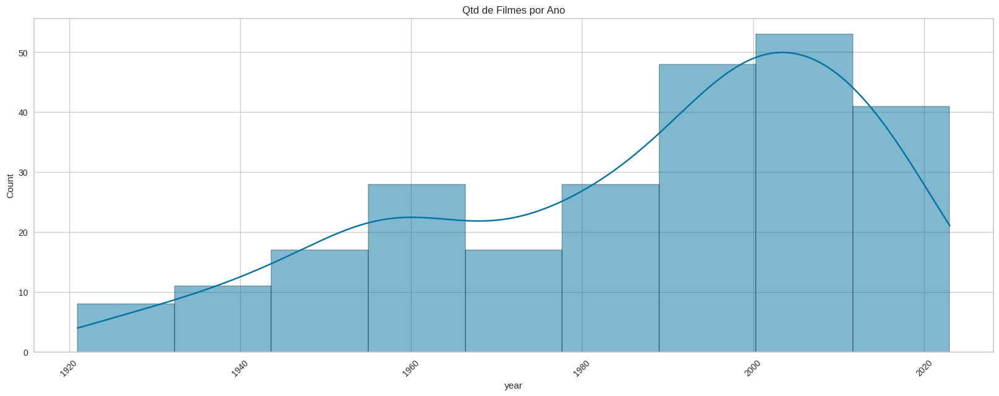

In [43]:
plt.figure(figsize = (20,7))
sns.histplot( df,
              x = 'year',
              kde = True).set_title('Qtd de Filmes por Ano')
plt.xticks(rotation=45)
plt.show()

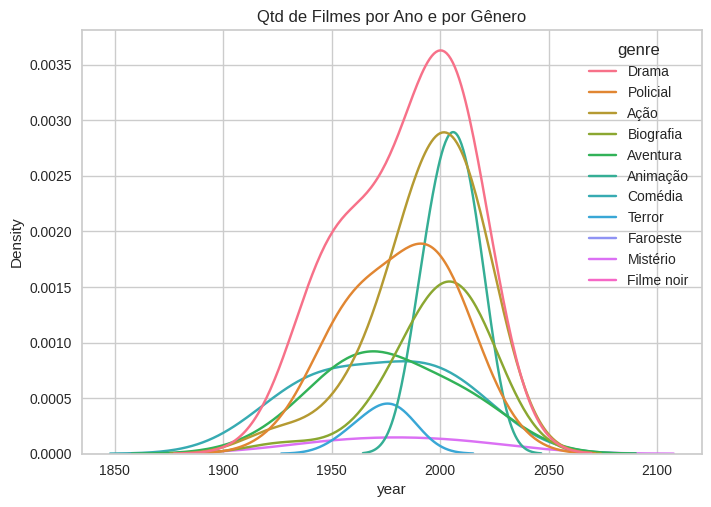

In [44]:
sns.kdeplot( df, x = 'year', hue = 'genre', bw_adjust = 1.5, warn_singular = False).set_title('Qtd de Filmes por Ano e por Gênero')
plt.show()

# Pré-processamento de texto

In [45]:
#convert sinopses to lowercase
df_processed = df.copy()
df_processed['sinopse'] = df_processed['sinopse'].str.lower()
df_processed['sinopse'].head()

0    dois homens presos se reúnem ao longo de vário...
1    o patriarca idoso de uma dinastia do crime org...
2    quando a ameaça conhecida como o coringa surge...
3    em 1950, michael corleone, agora à frente da f...
4    o julgamento de um assassinato em nova iorque ...
Name: sinopse, dtype: object

In [46]:
def qty_words(text):
    words= text.split()
    word_count = len(words)
    return word_count

In [47]:
### Feature Engineering
df_processed['word_count'] = df_processed['sinopse'].apply(qty_words).astype('int64')
df_processed.head()

,title_pt,title_en,year,rating,genre,sinopse,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,...,pixel_139_198,pixel_139_199,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206,word_count
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,156.0,166.0,178.0,151.0,...,6.0,5.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,21
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,250.0,237.0,252.0,250.0,...,7.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,20
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,5.0,1.0,17.0,17.0,...,1.0,2.0,1.0,12.0,7.0,1.0,3.0,6.0,1.0,33
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",248.0,249.0,249.0,250.0,...,37.0,38.0,40.0,39.0,37.0,36.0,36.0,37.0,38.0,41
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,o julgamento de um assassinato em nova iorque ...,130.0,129.0,129.0,128.0,...,59.0,51.0,62.0,78.0,117.0,85.0,50.0,83.0,113.0,29


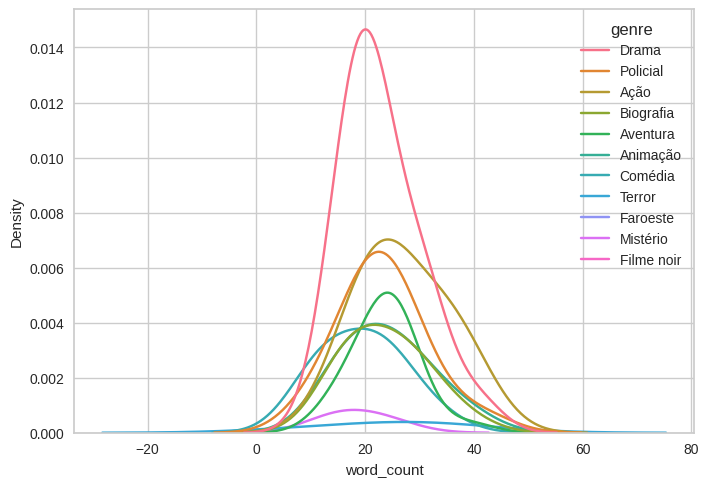

In [48]:
sns.kdeplot( df_processed, x = 'word_count', hue = 'genre', bw_adjust = 1.5, warn_singular = False)
plt.show()

## Nuvem de palavras

### Antes de remover as stopwords

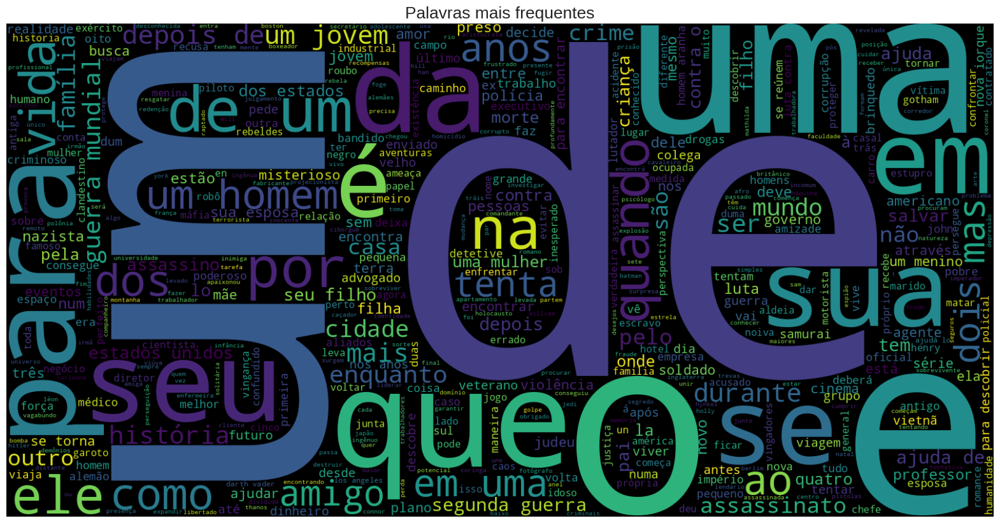

In [49]:
text = ' '.join([phrase for phrase in df_processed['sinopse']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes', fontsize = 19)
plt.show()

### Após remoção das stopwords

In [50]:
import nltk
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('portuguese')
print(stopwords)

['a', 'à', 'ao', 'aos', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aquilo', 'as', 'às', 'até', 'com', 'como', 'da', 'das', 'de', 'dela', 'delas', 'dele', 'deles', 'depois', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'entre', 'era', 'eram', 'éramos', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 'estava', 'estavam', 'estávamos', 'este', 'esteja', 'estejam', 'estejamos', 'estes', 'esteve', 'estive', 'estivemos', 'estiver', 'estivera', 'estiveram', 'estivéramos', 'estiverem', 'estivermos', 'estivesse', 'estivessem', 'estivéssemos', 'estou', 'eu', 'foi', 'fomos', 'for', 'fora', 'foram', 'fôramos', 'forem', 'formos', 'fosse', 'fossem', 'fôssemos', 'fui', 'há', 'haja', 'hajam', 'hajamos', 'hão', 'havemos', 'haver', 'hei', 'houve', 'houvemos', 'houver', 'houvera', 'houverá', 'houveram', 'houvéramos', 'houverão', 'houverei', 'houverem', 'houveremos', 'houveria', 'houveriam', 'houveríamos', 'houvermos', 'houvesse', 'houvessem', 'houvésse

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/henrico/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


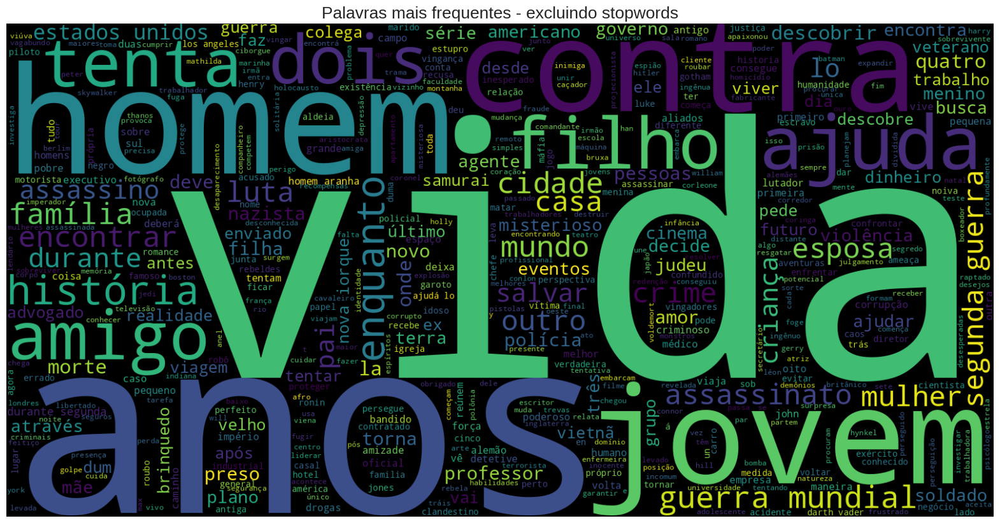

In [51]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
text = ' '.join([phrase for phrase in df_processed['sinopse_no_stopwords']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes - excluindo stopwords', fontsize = 19)
plt.show()

## Aplicando TF-IDF
Term Frequency-Inverse Document Frequency

O TF-IDF define a importância de um termo levando em consideração a importância desse termo em um único documento e dimensionando-o por sua importância em todos os documentos.

In [52]:
def limpar_texto(texto):
    stemmer = PorterStemmer()
    texto = normalize('NFKD', texto).encode('ASCII', 'ignore').decode('utf-8').lower()
    texto = texto.translate(str.maketrans('', '', string.punctuation))
    # palavras = texto.split()
    # stemmed_palavras = [stemmer.stem(palavra) for palavra in palavras]
    # texto_limpo = ' '.join(stemmed_palavras)
    # return texto_limpo
    return texto

In [53]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse_no_stopwords'].apply(limpar_texto)

In [54]:
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(df_processed['sinopse_no_stopwords'])

In [55]:
print(X.shape)
X.toarray()

(251, 79)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.]])

# KMeans - Clusterização

## Escolhendo o numero de "k" clusters ideal

### Método Elbow

2 222.6671050669214
3 219.00706338283456
4 209.7834082108504
5 207.53384887657035
6 201.68882036624694
7 198.3234415431841
8 195.17352807337218
9 187.37954259395352
10 185.58056460440562
11 187.1899377441071


/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Text(0, 0.5, 'WCSS')

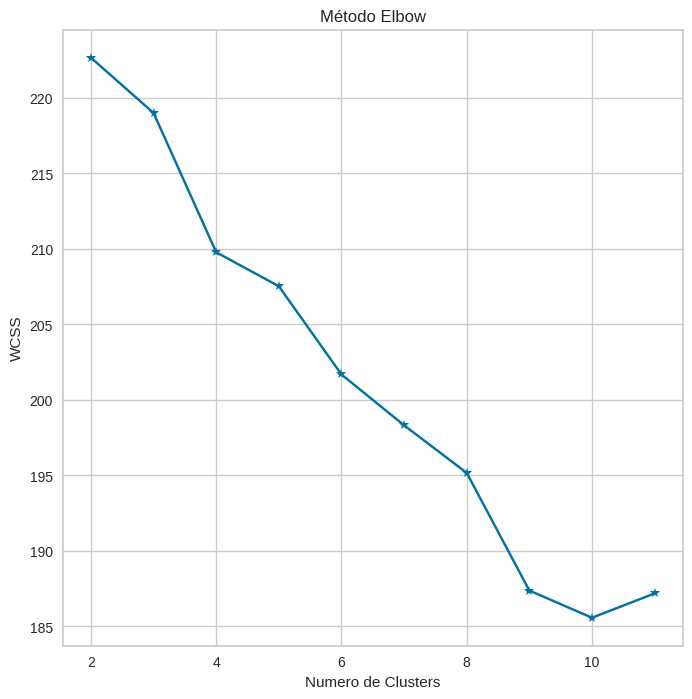

In [56]:
plt.figure(figsize = (8,8))

#plotando o grafico do método elbow
wcss = []

for i in range(2, df_processed.genre.nunique()+1):
  kmeans = KMeans(n_clusters = i, init = 'random')
  kmeans.fit(X)
  print(i, kmeans.inertia_)
  wcss.append(kmeans.inertia_)

plt.plot(range(2, df_processed.genre.nunique()+1), wcss, '*-')
plt.title('Método Elbow')
plt.xlabel('Numero de Clusters')
plt.ylabel('WCSS') #within cluster sum of square


### Método Silhouette

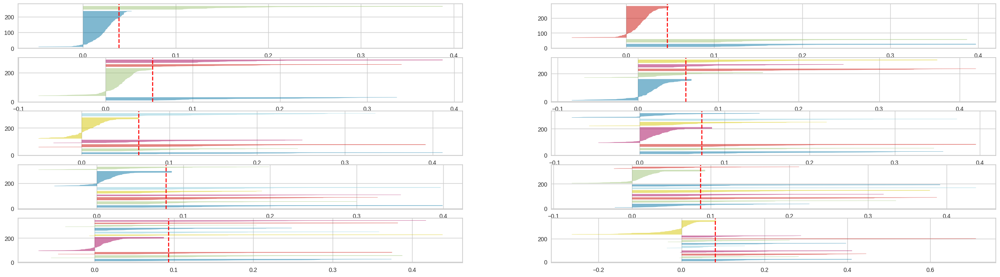

In [57]:
fig, ax = plt.subplots(5,2, figsize = (30,8))
for i in (range(2, df_processed.genre.nunique()+1)):
  #Creating KMeans instance for different number of clusters
  kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 10, max_iter = 100, random_state = 42)
  q, mod = divmod(i,2)

  #Creating SilhouetteVisualizer instance with KMeans instance
  #Fit the visualizer

  visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick', ax = ax[q-1][mod])
  visualizer.fit(X)

In [58]:
df_processed

,title_pt,title_en,year,rating,genre,sinopse,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,...,pixel_139_199,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206,word_count,sinopse_no_stopwords
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,156.0,166.0,178.0,151.0,...,5.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,21,dois homens presos reunem longo varios anos en...
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,250.0,237.0,252.0,250.0,...,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,20,patriarca idoso dinastia crime organizado tran...
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,5.0,1.0,17.0,17.0,...,2.0,1.0,12.0,7.0,1.0,3.0,6.0,1.0,33,ameaca conhecida coringa surge passado causa e...
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",248.0,249.0,249.0,250.0,...,38.0,40.0,39.0,37.0,36.0,36.0,37.0,38.0,41,1950 michael corleone agora frente familia ten...
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,o julgamento de um assassinato em nova iorque ...,130.0,129.0,129.0,128.0,...,51.0,62.0,78.0,117.0,85.0,50.0,83.0,113.0,29,julgamento assassinato nova iorque frustrado u...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,A Vida de Brian,248. A Vida de Brian,1979,8.0,Comédia,nascido no natal original no estábulo ao lado ...,248.0,177.0,159.0,181.0,...,152.0,176.0,160.0,138.0,134.0,241.0,208.0,123.0,20,nascido natal original estabulo lado jesus bri...
247,Aladdin,249. Aladdin,1992,8.0,Animação,um menino de rua bondoso e um vizir competem p...,46.0,43.0,40.0,41.0,...,57.0,57.0,57.0,59.0,59.0,59.0,57.0,56.0,23,menino rua bondoso vizir competem lampada magi...
248,A Chantagem,250. A Chantagem,2015,8.2,Policial,um homem toma medidas desesperadas para tentar...,94.0,93.0,86.0,91.0,...,107.0,62.0,59.0,53.0,97.0,110.0,2.0,0.0,22,homem toma medidas desesperadas tentar salvar ...
249,Barbie,Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29,viver terra barbie perfeito lugar perfeito men...


### Metodo Calinski e Davies

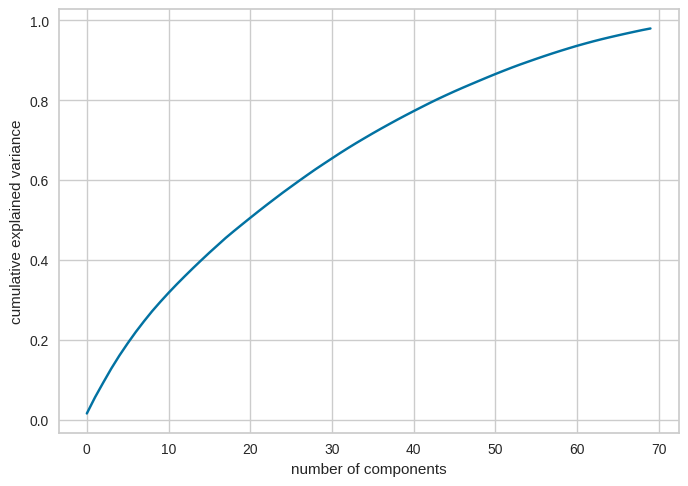

In [60]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=70)
X_reduced = svd.fit_transform(X)

plt.plot(np.cumsum(svd.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [61]:
from sklearn.cluster import KMeans
import os
from shutil import copyfile
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/c

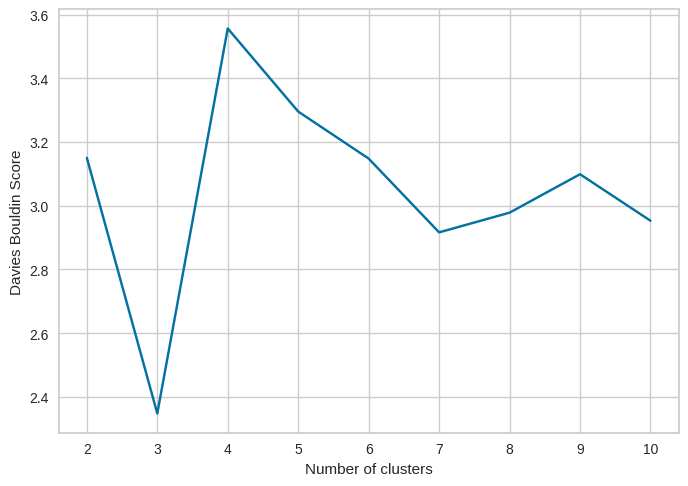

In [62]:
results = {}

for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=30)
    labels = kmeans.fit_predict(X.toarray())
    db_index = davies_bouldin_score(X.toarray(), labels)
    results.update({i: db_index})

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Davies Bouldin Score")
plt.show()

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/c

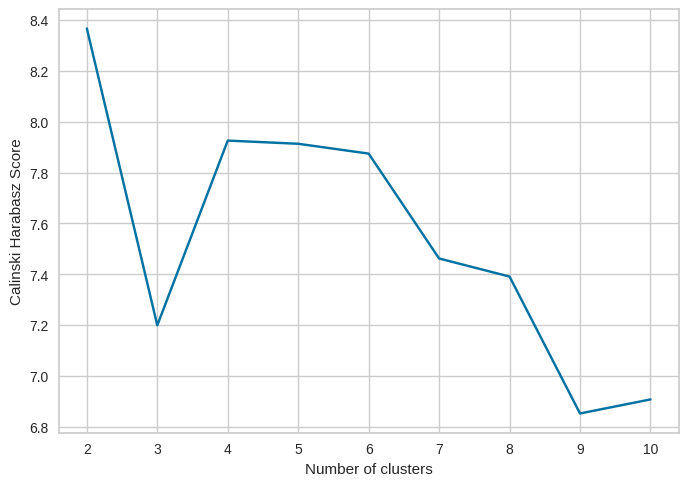

In [63]:
results = {}

for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=30)
    labels = kmeans.fit_predict(X.toarray())
    db_index = calinski_harabasz_score(X.toarray(), labels)
    results.update({i: db_index})

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Calinski Harabasz Score")
plt.show()

### Análise do número de clusters | k = 10
* Ao analisar os 4 metodos de calculos de cluster, foi decidido que com um numero de 3 clusters, pois com o calculo de calinski resultou em 9 e 10 clusters mais proximos do eixo x. E por conta da quantidade de amostras que temos.

# Comparativo entre os 10 clusters

In [76]:
# initialize kmeans with 5 centroids
kmeans = KMeans(n_clusters = 10, random_state=42)
# fit the model
kmeans = kmeans.fit(X)
#predicting the clusters and store cluster labels in a variable
labels = kmeans.predict(X)
#getting the cluster centers
c = kmeans.cluster_centers_

df_processed['cluster'] = labels
df_processed.head()

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,title_pt,title_en,year,rating,genre,sinopse,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,...,pixel_139_200,pixel_139_201,pixel_139_202,pixel_139_203,pixel_139_204,pixel_139_205,pixel_139_206,word_count,sinopse_no_stopwords,cluster
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,156.0,166.0,178.0,151.0,...,7.0,7.0,7.0,7.0,7.0,7.0,7.0,21,dois homens presos reunem longo varios anos en...,8
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,250.0,237.0,252.0,250.0,...,9.0,9.0,9.0,9.0,9.0,9.0,9.0,20,patriarca idoso dinastia crime organizado tran...,9
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,5.0,1.0,17.0,17.0,...,1.0,12.0,7.0,1.0,3.0,6.0,1.0,33,ameaca conhecida coringa surge passado causa e...,7
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",248.0,249.0,249.0,250.0,...,40.0,39.0,37.0,36.0,36.0,37.0,38.0,41,1950 michael corleone agora frente familia ten...,3
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,o julgamento de um assassinato em nova iorque ...,130.0,129.0,129.0,128.0,...,62.0,78.0,117.0,85.0,50.0,83.0,113.0,29,julgamento assassinato nova iorque frustrado u...,7


## Filmes por cluster

In [77]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

## % de Gêneros por Cluster

/home/henrico/Github/venv/lib/python3.10/site-packages/seaborn/categorical.py:3201: UserWarning:

Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.

/home/henrico/Github/venv/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



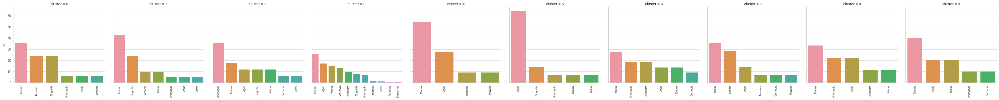

In [78]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

## Ano de Lançamento por Cluster

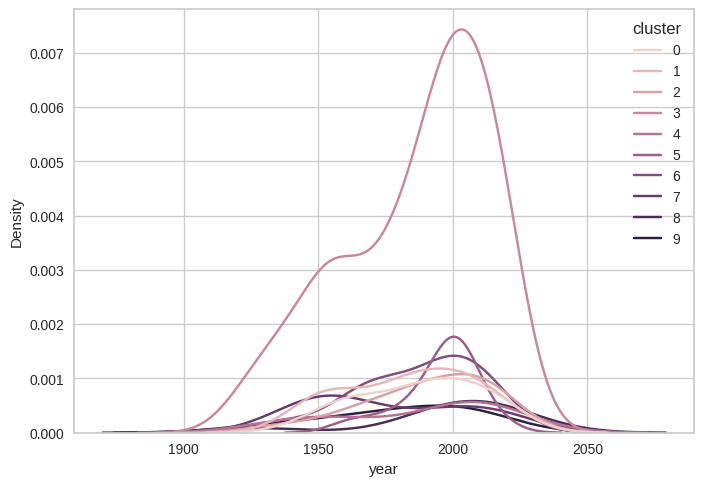

In [79]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

## Radar | Gêneros por Cluster

In [80]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,0,1,2,3,4,5,6,7,8,9
0,Animação,5.882353,4.761905,35.294118,6.896552,0.000000,7.142857,18.181818,0.000000,22.222222,10.0
1,Aventura,23.529412,0.000000,0.000000,9.482759,0.000000,0.000000,18.181818,7.142857,11.111111,0.0
2,Ação,5.882353,4.761905,11.764706,17.241379,27.272727,64.285714,13.636364,14.285714,22.222222,20.0
3,Biografia,23.529412,23.809524,11.764706,7.758621,9.090909,14.285714,0.000000,0.000000,0.000000,0.0
4,Comédia,5.882353,9.523810,5.882353,12.931034,0.000000,0.000000,9.090909,7.142857,0.000000,10.0
5,Drama,35.294118,42.857143,17.647059,25.862069,54.545455,7.142857,13.636364,28.571429,33.333333,40.0
6,Faroeste,0.000000,0.000000,0.000000,0.862069,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
7,Filme noir,0.000000,0.000000,0.000000,0.862069,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
8,Mistério,0.000000,0.000000,0.000000,1.724138,9.090909,0.000000,0.000000,7.142857,0.000000,0.0
9,Policial,0.000000,9.523810,11.764706,14.655172,0.000000,7.142857,27.272727,35.714286,11.111111,20.0


In [81]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Animação,0,5.882353
1,Aventura,0,23.529412
2,Ação,0,5.882353
3,Biografia,0,23.529412
4,Comédia,0,5.882353


In [82]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

# Nuvem de Palavras por Cluster

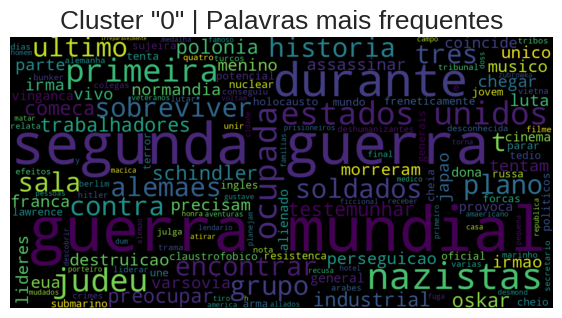

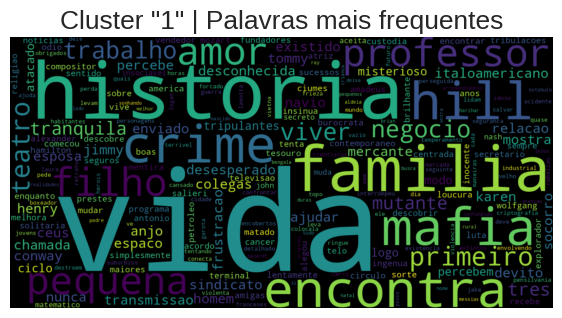

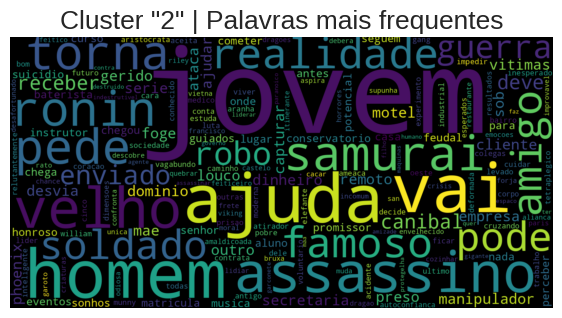

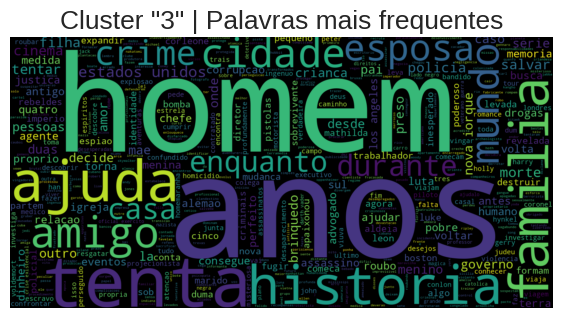

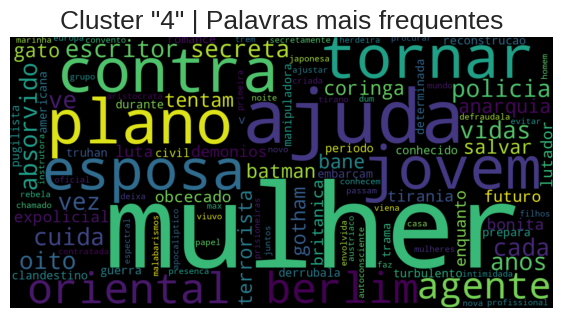

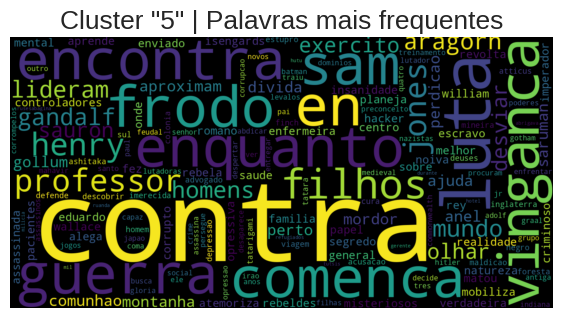

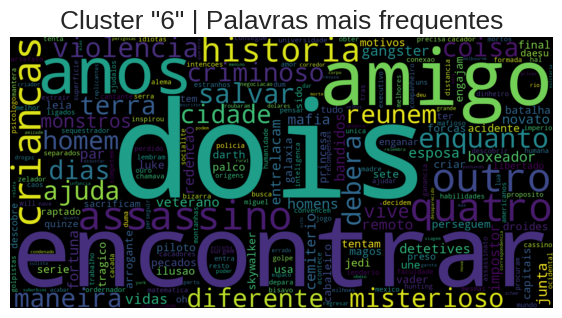

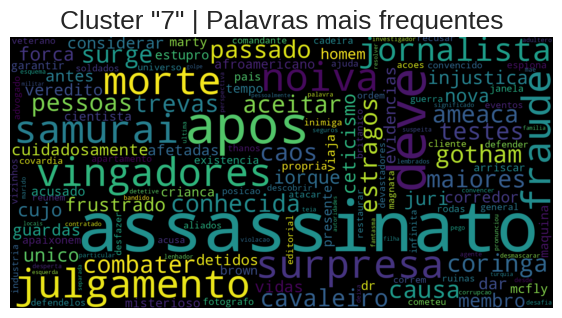

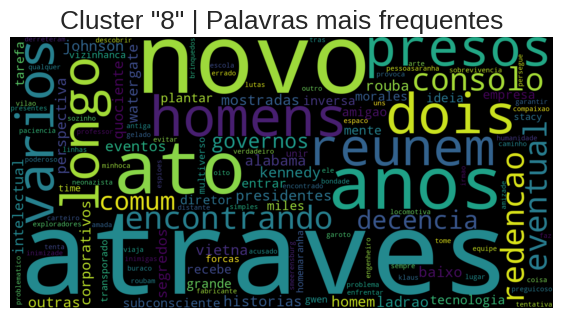

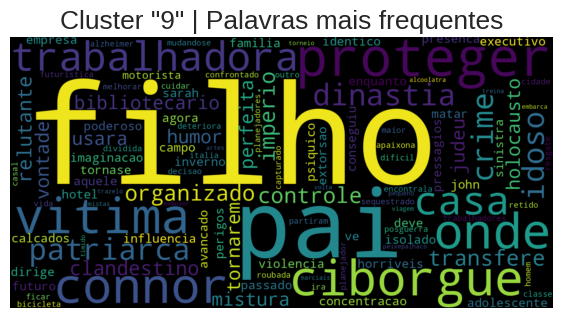

In [83]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

for c in range(10):
  word_cloud_cluster(c)

# Considerações Finais
* **Exercício: Reescrever as análises / conclusões devido a atualização da base**

** Na seção "Comparativo entre os 10 clusters" foram apresentadas diferentes formas de caracterizar cada cluster.**

1. Primeiro foi demonstrado que o cluster #2 foi o que apresentou o maior número de amostras (filmes). _(Idealmente os cluster devem conter quantidades balanceadas, porém neste projeto, por ter um dataset com baixo número de amostras (250), não foi possível atender esta premissa)_.

2. Depois foi analisado o % de cada gênero por cluster, sendo os dois gêneros mais representativos do:

  2.1 Cluster 0: Animação e Drama

  2.2 Cluster 1: Biografia e Aventura

  2.3 Cluster 2: Drama e Ação

  2.4 Cluster 3: Drama e Biografia

  2.5 Cluster 4: Drama e Comédia


3. Na sequência foi avaliado a distribuição dos anos de lançamento dos filmes por cluster, sem diferença siginificativa entre eles, com maior concentração ao redor do ano 2000.

4. Depois foi apresentado um gráfico de radar por cluster, onde a exemplo do item 2, é possível avaliar a representatividade de cada gênero por cluster.

5. E finalmente, foram apresentadas as nuvens de palavras por cluster, onde em linhas gerais destacam-se:

  5.1 o Cluster 0 com temas sobre Guerra Mundial, Luta, Judeus, Alemães

  5.2 O Cluster 1 e 3 com temas de disputa como Contra, Morte, Advogado, Homem,Polícia

  5.3 o Cluster 2 com temas do cotidiano como Filhos, Amigos, Ajuda, Jovem, Família

  5.4 o Cluster 4 com temas de auto-conhecimento como Busca, Encontrar, Descobrir, Casa, Terra


** Em resumo neste projeto foram aplicados conceitos de:

1. Webscraping / Crawler para coleta de dados do site IMDb
2. Pré-processamento de texto com utilização de técnicas de NLP
3. Clusterização

Desta forma consideramos que o objetivo inicial foi atingido sendo possível a clusterização dos filmes baseado na sinopse / descrição de cada um, gerando desta forma a possibilidade de recomendar filmes aos usuários não apenas pela classificação tradicional por gêneros, mas também pelos clusters identificados neste projeto.

**Em termos práticos, se um usuário avalia positivamente um filme, os filmes pertecentes ao mesmo cluster podem ser recomendados a ele.**